In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings("ignore")


In [2]:
# Load the dataset
data_path = 'C://Users//prava//OneDrive//Desktop//profcess//proj data.csv'
data = pd.read_csv(data_path)

# Data Cleaning
data.columns = data.iloc[0]  # Set the first row as header
data = data.drop(0)  # Drop the header row from the data
data = data.rename(columns=lambda x: x.strip())  # Clean column names
data = data.apply(pd.to_numeric, errors='coerce')  # Convert to numeric
data = data.dropna()  # Drop rows with missing values

# Feature and Target Separation
X = data.drop(columns=['class'])
y = data['class']


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 1 to 756
Columns: 755 entries, id to class
dtypes: float64(749), int64(6)
memory usage: 4.4 MB
None

Summary Statistics:
0              id      gender         PPE         DFA        RPDE   numPulses  \
count  756.000000  756.000000  756.000000  756.000000  756.000000  756.000000   
mean   125.500000    0.515873    0.746284    0.700414    0.489058  323.972222   
std     72.793721    0.500079    0.169294    0.069718    0.137442   99.219059   
min      0.000000    0.000000    0.041551    0.543500    0.154300    2.000000   
25%     62.750000    0.000000    0.762833    0.647053    0.386537  251.000000   
50%    125.500000    1.000000    0.809655    0.700525    0.484355  317.000000   
75%    188.250000    1.000000    0.834315    0.754985    0.586515  384.250000   
max    251.000000    1.000000    0.907660    0.852640    0.871230  907.000000   

0      numPeriodsPulses  meanPeriodPulses  stdDevPeriodPulses  locPctJit

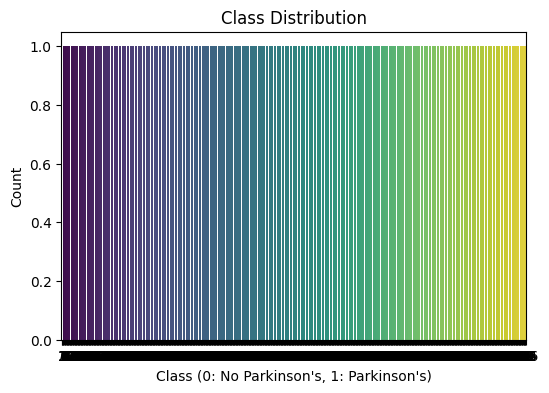

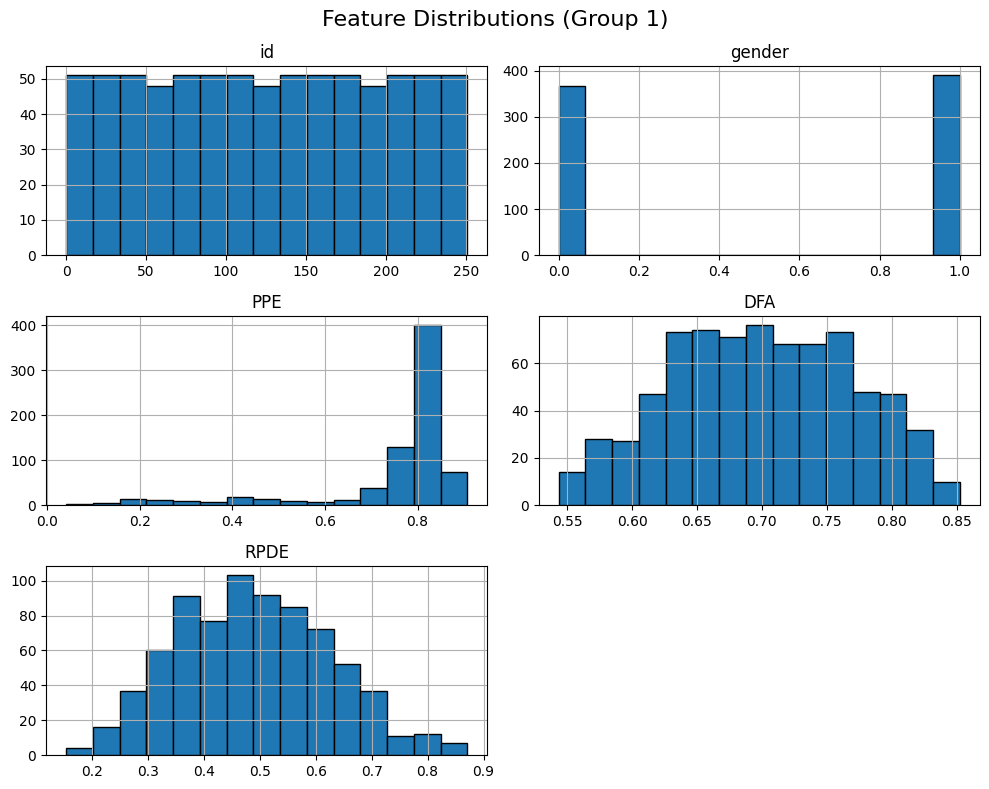

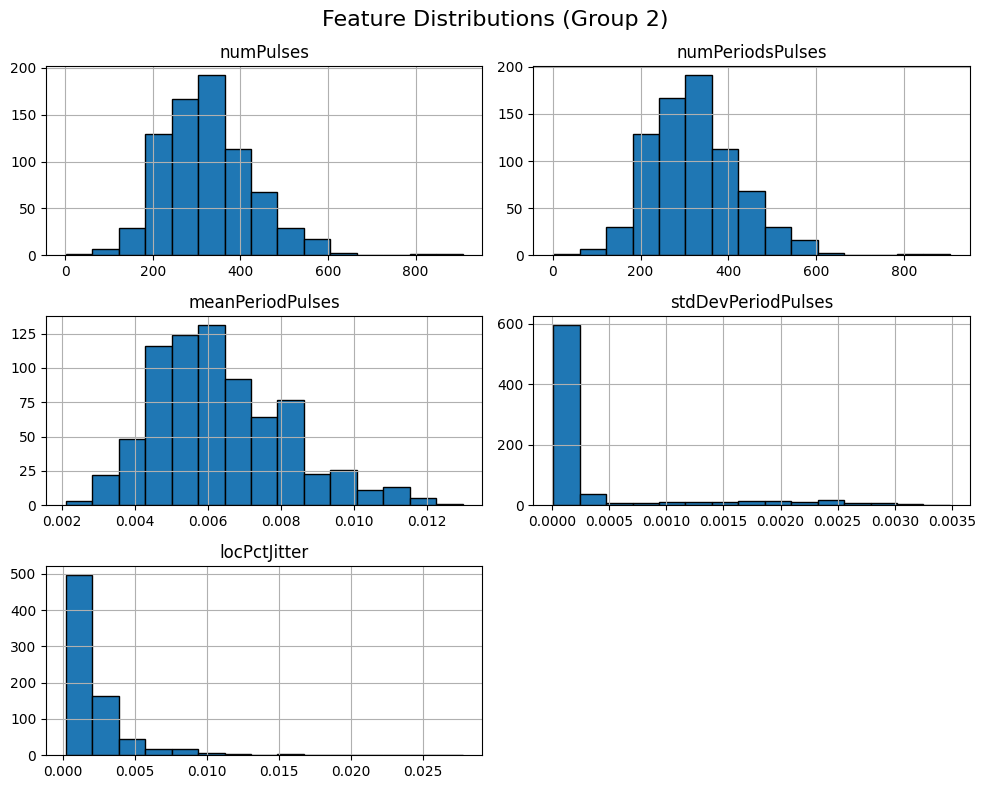

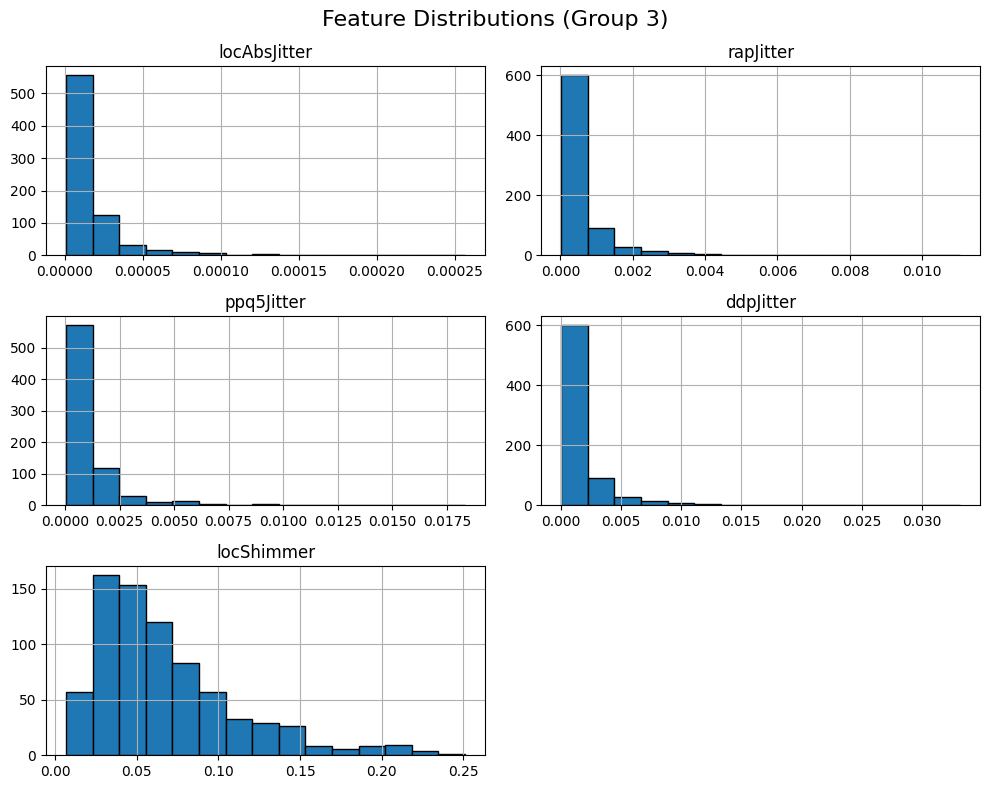

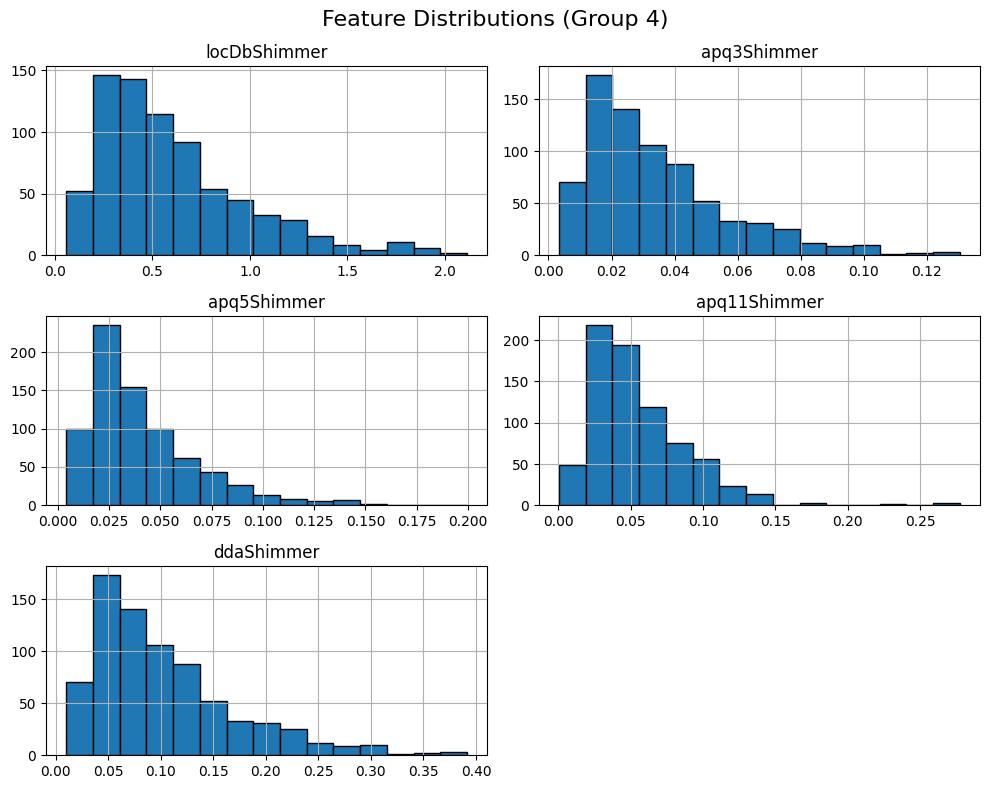

...

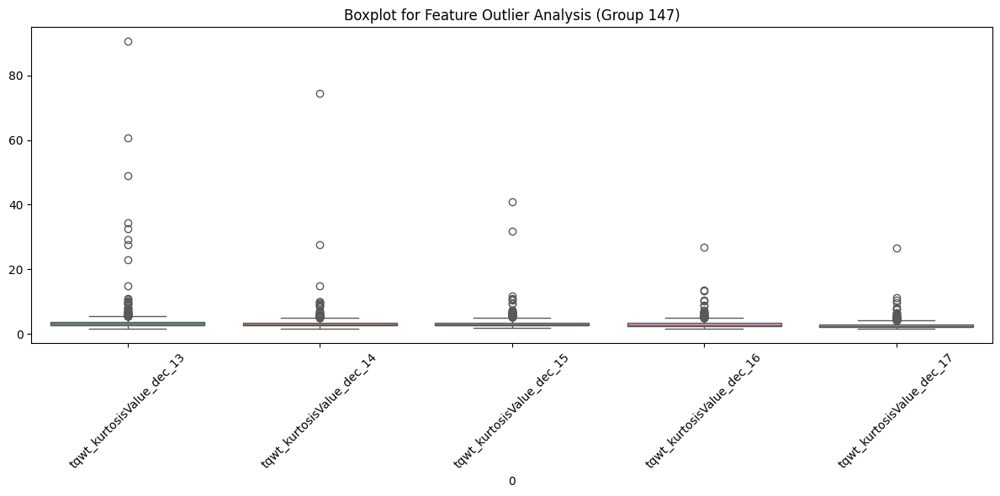

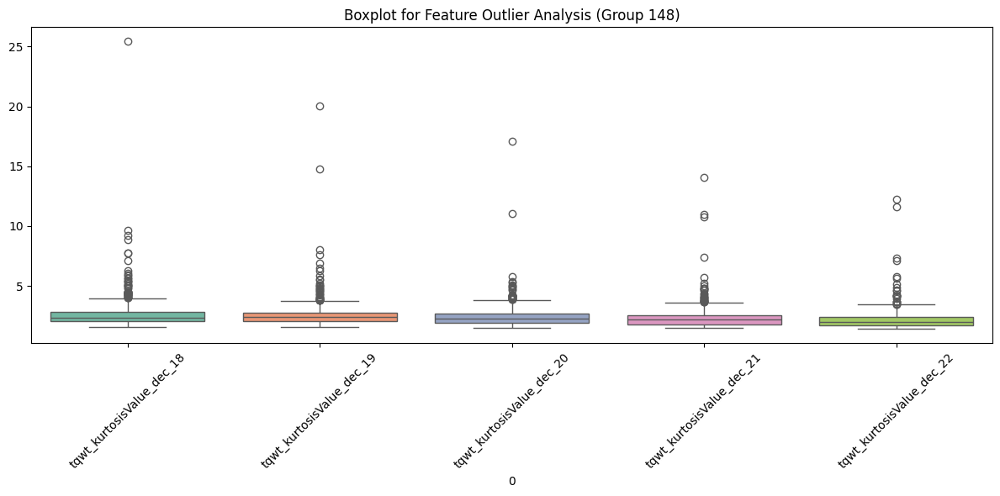

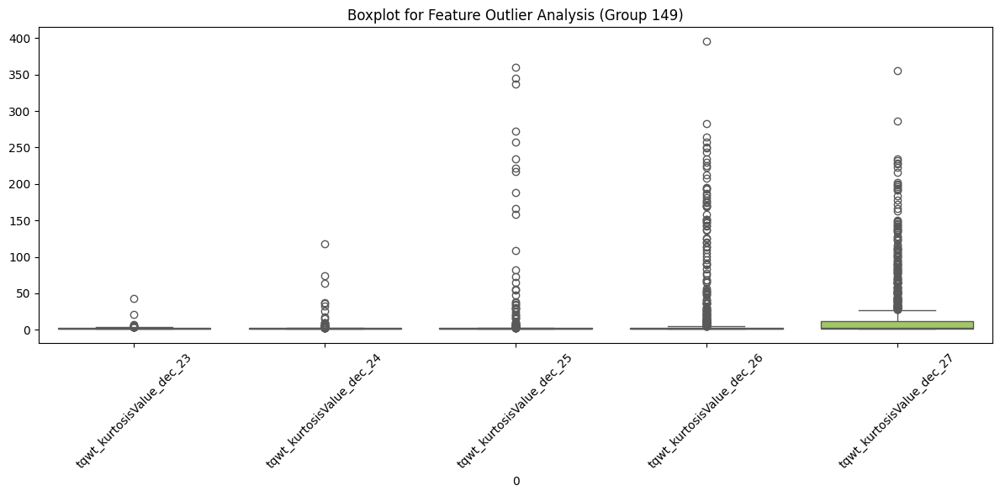

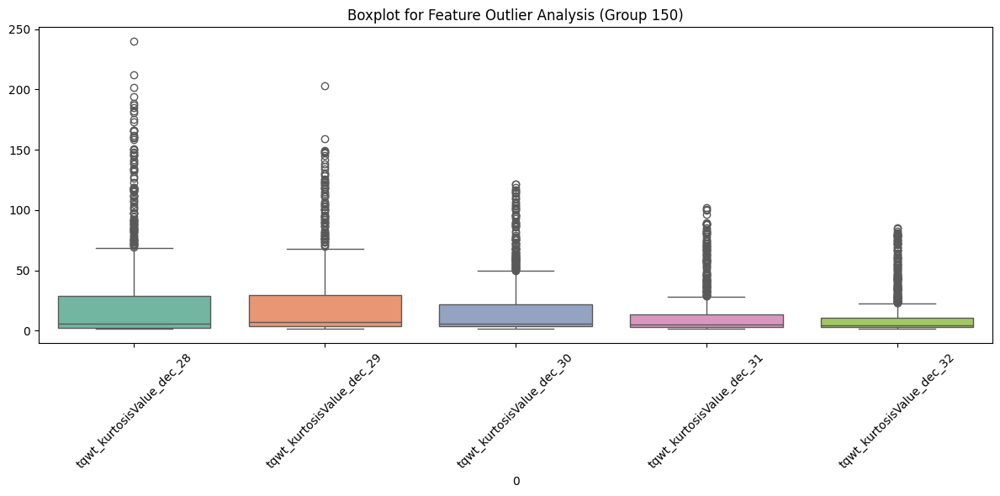

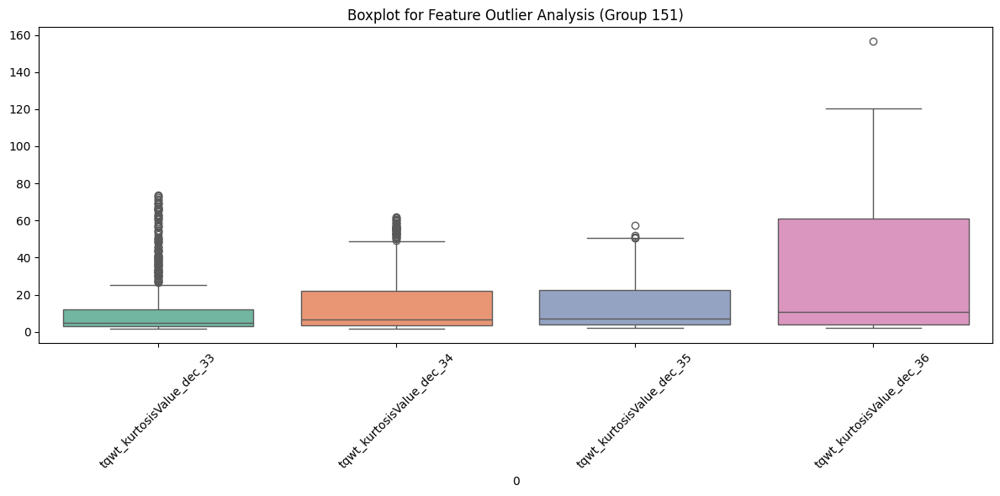

In [7]:
# Dataset Information
print("Dataset Info:")
print(data.info())

print("\nSummary Statistics:")
print(data.describe())

# Class Distribution
plt.figure(figsize=(6, 4))
sns.countplot(data['class'], palette="viridis")
plt.title("Class Distribution")
plt.xlabel("Class (0: No Parkinson's, 1: Parkinson's)")
plt.ylabel("Count")
plt.show()

# Distribution of Features (in groups of 5)
feature_groups = [X.columns[i:i+5] for i in range(0, len(X.columns), 5)]
for i, group in enumerate(feature_groups):
    X[group].hist(figsize=(10, 8), bins=15, edgecolor='black')
    plt.suptitle(f"Feature Distributions (Group {i+1})", fontsize=16)
    plt.tight_layout()
    plt.show()

# Correlation Heatmap (Top 10 Correlated Features with Target)
plt.figure(figsize=(10, 8))
correlation_with_target = data.corr()['class'].drop('class')
top_corr_features = correlation_with_target.abs().sort_values(ascending=False).head(10).index
sns.heatmap(data[top_corr_features].corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap (Top 10 Features)")
plt.tight_layout()
plt.show()

# Check for Outliers using Boxplot (in groups of 5)
for i, group in enumerate(feature_groups):
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=X[group], palette="Set2")
    plt.title(f"Boxplot for Feature Outlier Analysis (Group {i+1})")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [4]:
# Feature Engineering: Add Polynomial Features and Select Best Features
feature_engineering_pipeline = Pipeline([
    ('scaler', StandardScaler()),                     # Standardize features
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),  # Generate polynomial features
    ('select', SelectKBest(score_func=f_classif, k=10))  # Select top 10 features
])

# Fit the pipeline on the training data
X_transformed = feature_engineering_pipeline.fit_transform(X, y)

# Check the selected features
selected_features = feature_engineering_pipeline.named_steps['select'].get_support(indices=True)
print("Selected Features:", X.columns[selected_features])


Selected Features: Index(['mean_MFCC_2nd_coef', 'std_9th_delta_delta', 'tqwt_entropy_log_dec_12',
       'tqwt_stdValue_dec_11', 'tqwt_stdValue_dec_12', 'tqwt_minValue_dec_11',
       'tqwt_minValue_dec_12', 'tqwt_minValue_dec_13', 'tqwt_maxValue_dec_11',
       'tqwt_maxValue_dec_12'],
      dtype='object', name=0)


In [5]:
# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

# Logistic Regression Pipeline
log_reg_pipeline = Pipeline([
    ('log_reg', LogisticRegression(max_iter=1000))
])

# XGBoost Pipeline
xgb_pipeline = Pipeline([
    ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss', n_estimators=100, max_depth=3))
])

# Train and Evaluate Logistic Regression
log_reg_pipeline.fit(X_train, y_train)
y_pred_log_reg = log_reg_pipeline.predict(X_test)
log_reg_accuracy = accuracy_score(y_test, y_pred_log_reg)
log_reg_report = classification_report(y_test, y_pred_log_reg)

# Train and Evaluate XGBoost
xgb_pipeline.fit(X_train, y_train)
y_pred_xgb = xgb_pipeline.predict(X_test)
xgb_accuracy = accuracy_score(y_test, y_pred_xgb)
xgb_report = classification_report(y_test, y_pred_xgb)


Logistic Regression Accuracy: 0.8289473684210527
Logistic Regression Report:
               precision    recall  f1-score   support

           0       0.83      0.39      0.54        38
           1       0.83      0.97      0.90       114

    accuracy                           0.83       152
   macro avg       0.83      0.68      0.72       152
weighted avg       0.83      0.83      0.81       152

XGBoost Accuracy: 0.8026315789473685
XGBoost Report:
               precision    recall  f1-score   support

           0       0.68      0.39      0.50        38
           1       0.82      0.94      0.88       114

    accuracy                           0.80       152
   macro avg       0.75      0.67      0.69       152
weighted avg       0.79      0.80      0.78       152



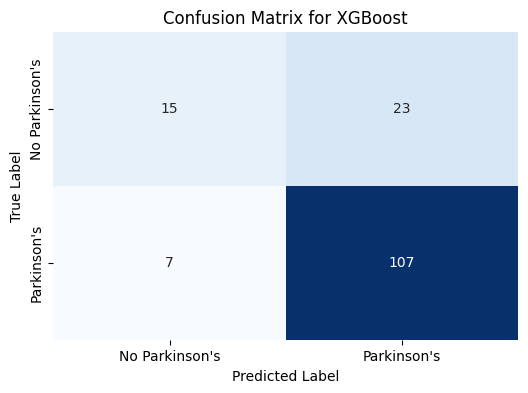

In [6]:
# Print Results
print("Logistic Regression Accuracy:", log_reg_accuracy)
print("Logistic Regression Report:\n", log_reg_report)
print("XGBoost Accuracy:", xgb_accuracy)
print("XGBoost Report:\n", xgb_report)

# Confusion Matrix for XGBoost
xgb_cm = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(6, 4))
sns.heatmap(xgb_cm, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["No Parkinson's", "Parkinson's"], 
            yticklabels=["No Parkinson's", "Parkinson's"])
plt.title("Confusion Matrix for XGBoost")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()
